In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.constants import N_A
import pints
from scipy.integrate import solve_ivp
import pints.plot
sns.set_context('talk')

In [2]:
Target_cell_number = 2e4
well_size = 50e-6
sigma = well_size*N_A/Target_cell_number
tumour_cell_radius = 7.25e-6
receptor_quant = {'500G_F': 11394, 'MSX_B':1670228, '500G_B':107477, '500G_L':1279}
parameter_names=[r'$k_{on}$', r'$K_D$', r'$k_2$', 'C', 'noise1', 'noise2']
t_end = 60*60*1
t = np.geomspace(1e-10, t_end, 50)
tspan = [1e-10, t_end]

In [3]:
def model_eqns(t, z, kon, KD, k2, rtot, Ainit):
    Atot = Ainit*sigma
    k1 = kon/sigma
    A0 = Atot - z[0] - z[1]
    r = rtot - z[0] - 2*z[1]

    dA1 = 2*k1*r*A0 - (KD*kon)*z[0] - k2*r*z[0] + 2*(KD*kon)*z[1]
    dA2 = k2*z[0]*r - 2*(KD*kon)*z[1]

    return [dA1, dA2]


def solve_model_individual(kon, KD, k2, rtot, A0s):
    solution = np.zeros_like(A0s)
    z0 = [0, 0]
    for i, Ainit in enumerate(A0s):
        z = solve_ivp(model_eqns, tspan, z0, method='Radau', t_eval=t, args=(kon, KD, k2, rtot, Ainit))
        A1 = z.y[0]
        A2 = z.y[1]
        bound_ab = A1[-1] + A2[-1]
        solution[i] = bound_ab
    
    return solution

def simulate_model(A0s, parameters, rtot):

    kon = parameters[0]
    kon = 10**kon
    KD = parameters[1]
    KD = 10**KD
    k2 = parameters[2]
    k2 = 10**k2
    #rtot = parameters[3]
    #rtot = 10**rtot
    C = parameters[3]
    C=10**C
    solution = np.zeros((len(A0s), 2))
    solution[:, 0] = (solve_model_individual(kon, KD, 0, rtot, A0s))
    solution[:, 1] = (solve_model_individual(kon, KD, k2, rtot, A0s))

    return C*solution


In [4]:
df = pd.read_excel(r'/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/Data/RE_ Mono vs Bivalent cell binding data - high affinity Ab/ELN339140_Tabular.xlsx')
df = df.dropna(subset=['CELL_ID']).reset_index(drop=True)
#df = df.dropna(subset=['ANTIBODY_ID']).reset_index(drop=True)

In [5]:
def data_extractor(df, cell_id, antibody_id):

    df1 = df.query('CELL_ID==@cell_id & ANTIBODY_ID==@antibody_id')
    mono_df = df1.query('ANTIBODY_FORMAT=="MONOVALENT"')
    biv_df = df1.query('ANTIBODY_FORMAT=="BIVALENT"')

    concs = list(np.flip(mono_df['ANTIBODY_CONCENTRATION_MOLAR'].values))
    response_mono = list(np.flip(mono_df['RESPONSE'].values))
    response_biv = list(np.flip(biv_df['RESPONSE'].values))
    
    return response_mono, response_biv, concs

In [6]:
def mcmc_alg(cell_id, antibody_id, rtot, conc_data, mono_data, biv_data):
    
    #setup data
    data = np.stack((mono_data, biv_data), axis=1)
    max = np.max(data)
    data = data/max 
    rtot = receptor_quant[cell_id]
    class model(pints.ForwardModel):

        def n_outputs(self):
         return 2
    
        def n_parameters(self):
         return 4
    
        def simulate(self, parameters, A0s):
         sim = simulate_model(A0s, parameters, rtot) 
         return sim/max
        

    #setup prior and posteriors
    mod = model()
    problem = pints.MultiOutputProblem(mod, conc_data, data)
    log_likelihood = pints.GaussianLogLikelihood(problem)
    parameters = [5, -9, -5, 1, 0.2, 0.2]
    log_prior = pints.UniformLogPrior(
        [4, -12, -9, -1, 0.01, 0.01],
        [6.5, -3, -4, 2, 1, 1]
    )
    log_posterior = pints.LogPosterior(log_likelihood, log_prior)

    #setup mcmc
    xs = [
        np.array(parameters) * 0.85,
        np.array(parameters) * 0.95,
        np.array(parameters) * 1.05,
        np.array(parameters) * 1.15 
        ]
    mcmc = pints.MCMCController(log_posterior, 4, xs)
    mcmc.set_max_iterations(15000)
    chains = mcmc.run()

    chain = chains[0]
    chain = chain[8000:]
    chains1 = chains[:, 8000 :]
    fig, axes = pints.plot.series(chains1[0], problem)

    plt.legend()
    plt.xscale('log')
    plt.xlabel(r'Antibody Concentration')
    parameter_names=[r'$k_{on}$', r'$K_D$', r'$k_2$', 'C', 'noise1', 'noise2']
    results = pints.MCMCSummary(chains=chains1, time=mcmc.time(),parameter_names=parameter_names)
    print(results)

    return chains, results   

MSX_B
Using Haario-Bardenet adaptive covariance MCMC
Generating 4 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Accept.   Time m:s
0     4      0         0         0         0          0:00.3
1     8      0.5       0         0         0.5        0:00.6
2     12     0.667     0         0         0.667      0:00.8
3     16     0.5       0.25      0         0.75       0:01.1
20    84     0.333     0.333     0.333     0.286      0:06.0
40    164    0.293     0.244     0.293     0.268      0:11.3
60    244    0.213     0.197     0.213     0.213      0:15.9
80    324    0.21      0.148     0.173     0.235      0:20.4
100   404    0.168     0.119     0.139     0.208      0:24.7
120   484    0.157     0.107438  0.124     0.174      0:29.7
140   564    0.141844  0.0993    0.113     0.149      0:34.5
160   644    0.124     0.087     0.0994    0.136646   0:38.8
180   724    0.11      0.0773    0.0884    0.138      0:42.9
Initial phase completed.
200   804    0.0995

/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/inf_env/lib/python3.12/site-packages/pints/plot/_series.py:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(n_outputs, 1, figsize=(8, np.sqrt(n_outputs) * 3),


param     mean    std.    2.5%    25%    50%    75%    97.5%    rhat    ess      ess per sec.
--------  ------  ------  ------  -----  -----  -----  -------  ------  -------  --------------
$k_{on}$  5.61    0.20    5.33    5.47   5.56   5.69   6.18     1.01    935.81   0.34
$K_D$     -8.83   0.06    -8.97   -8.87  -8.83  -8.79  -8.71    1.00    1000.40  0.36
$k_2$     -5.00   0.26    -5.52   -5.17  -5.00  -4.84  -4.48    1.00    1104.23  0.40
C         1.56    0.01    1.55    1.56   1.56   1.57   1.58     1.00    1119.25  0.41
noise1    0.03    0.01    0.02    0.03   0.03   0.04   0.05     1.00    941.03   0.34
noise2    0.05    0.01    0.04    0.05   0.05   0.06   0.08     1.01    889.56   0.32
Using Haario-Bardenet adaptive covariance MCMC
Generating 4 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Accept.   Time m:s
0     4      0         0         0         0          0:00.2
1     8      0.5       0.5       0.5       0          0:00.4
2     12     0.

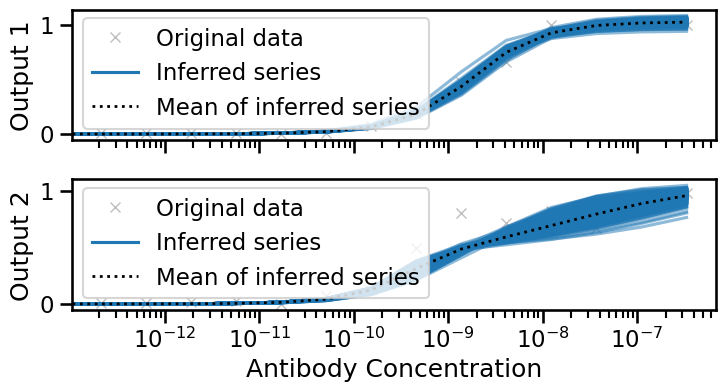

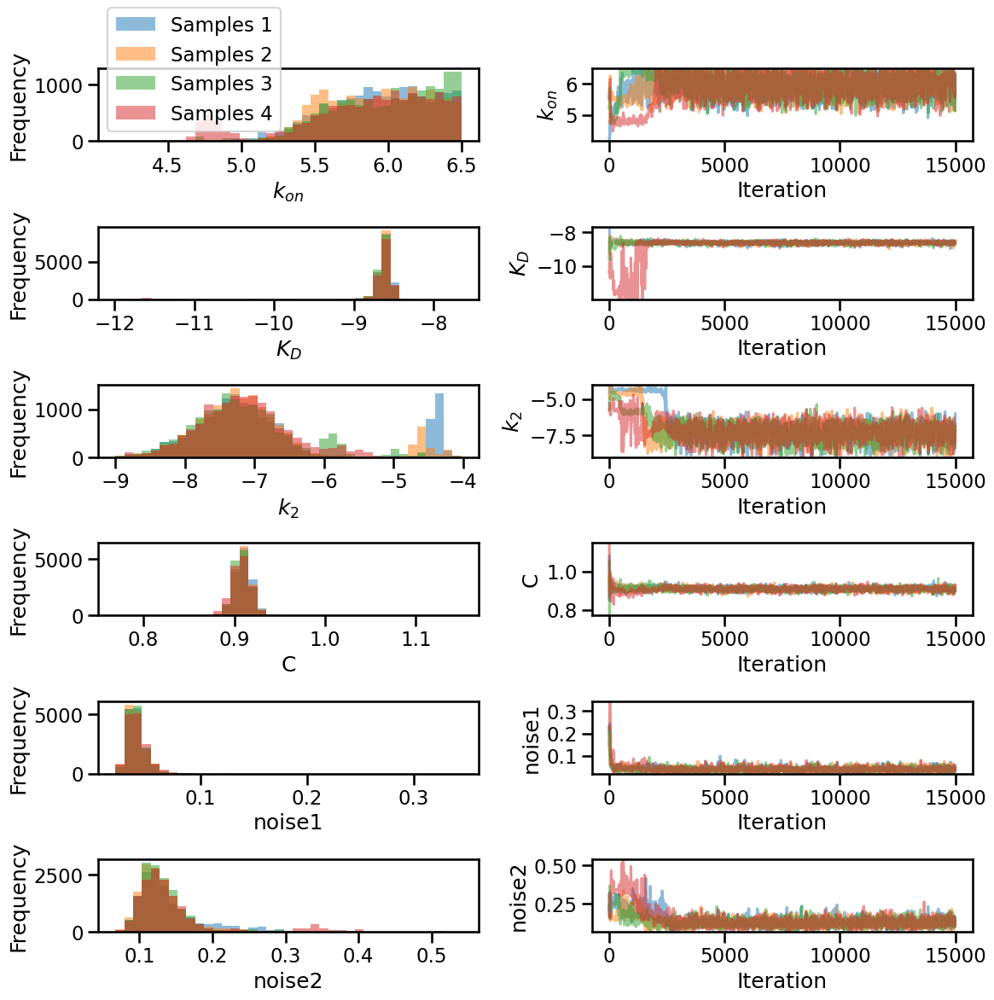

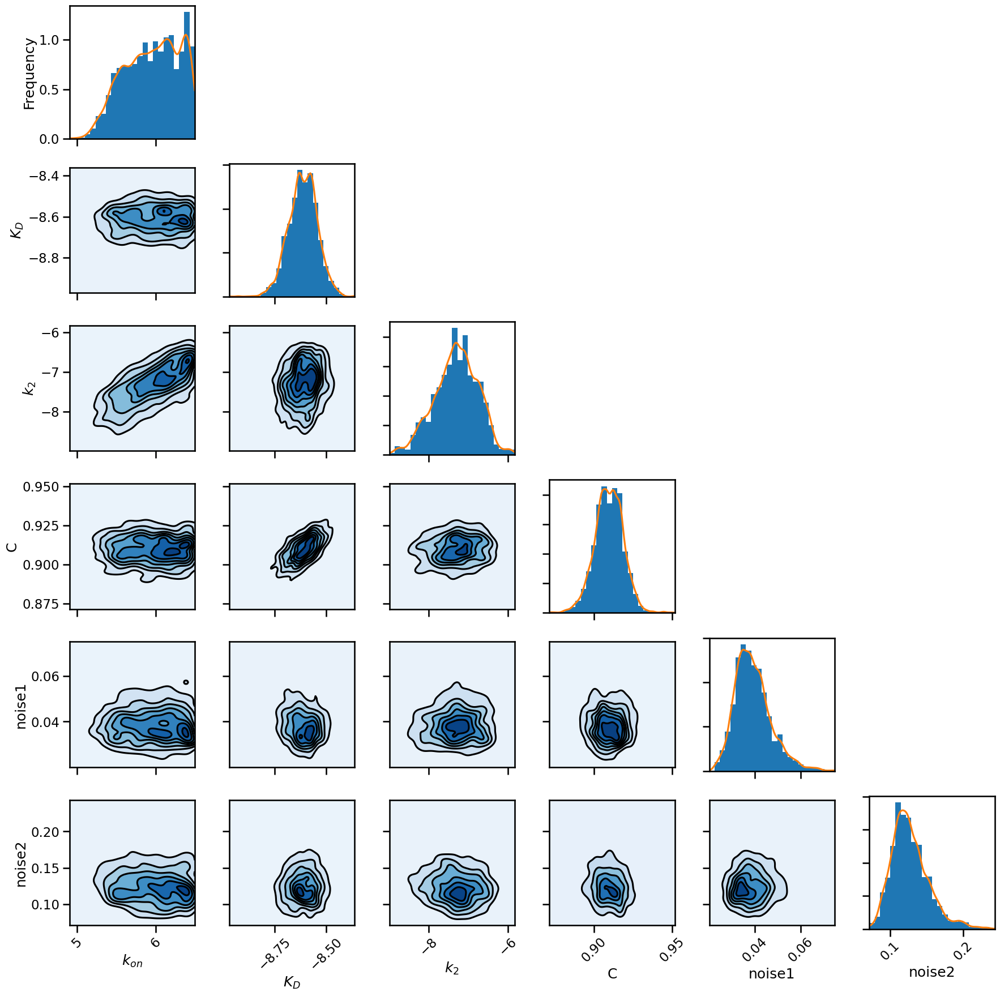

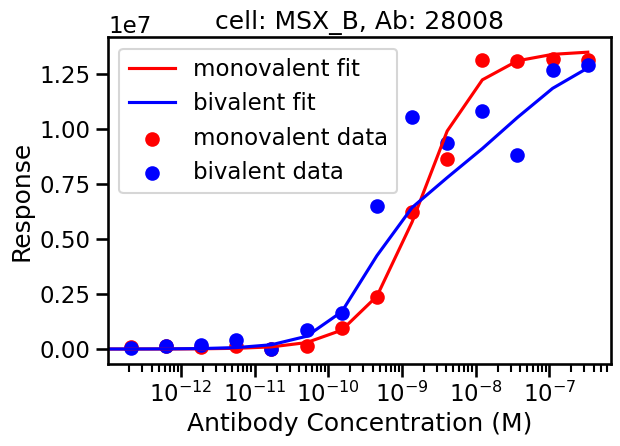

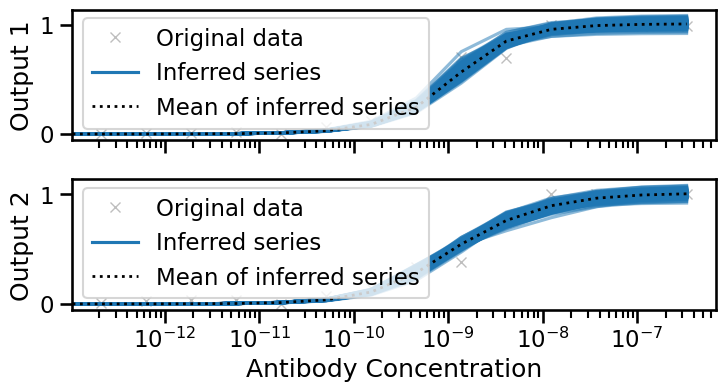

...

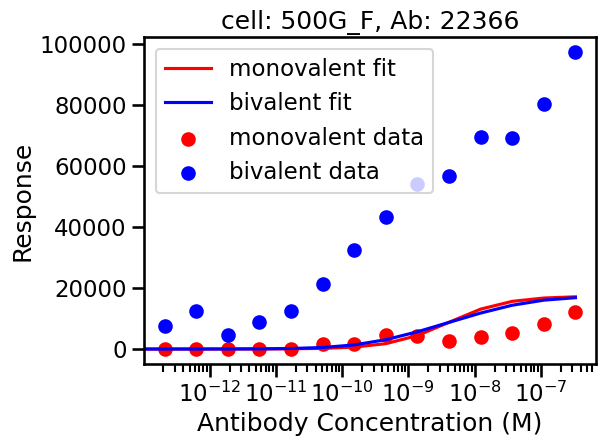

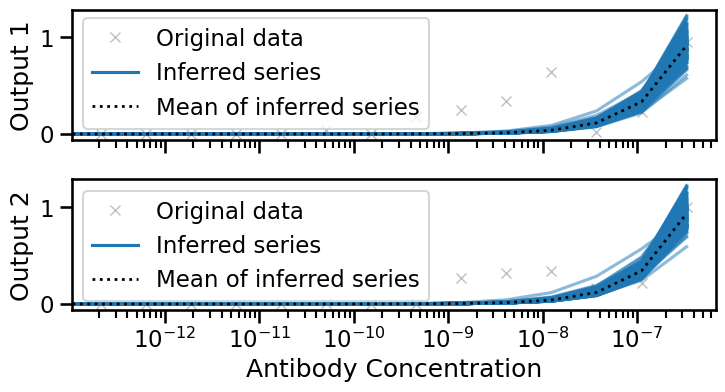

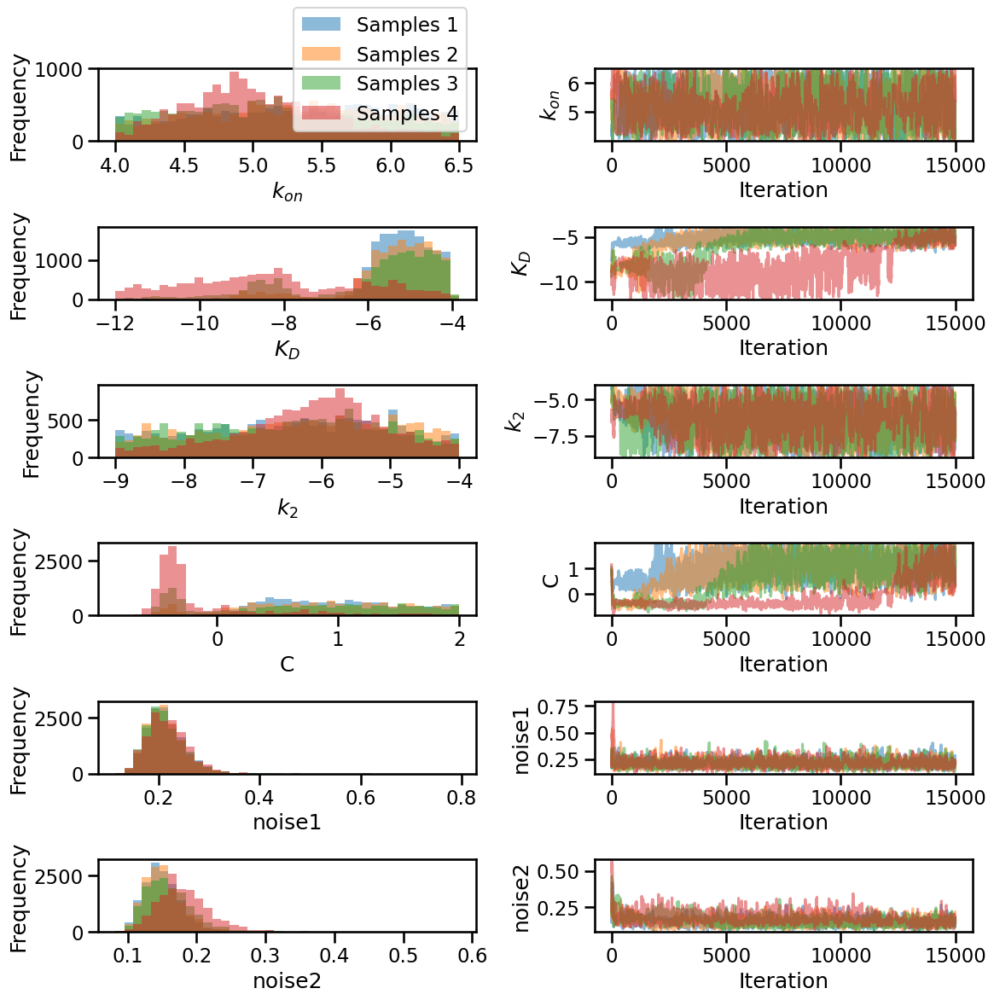

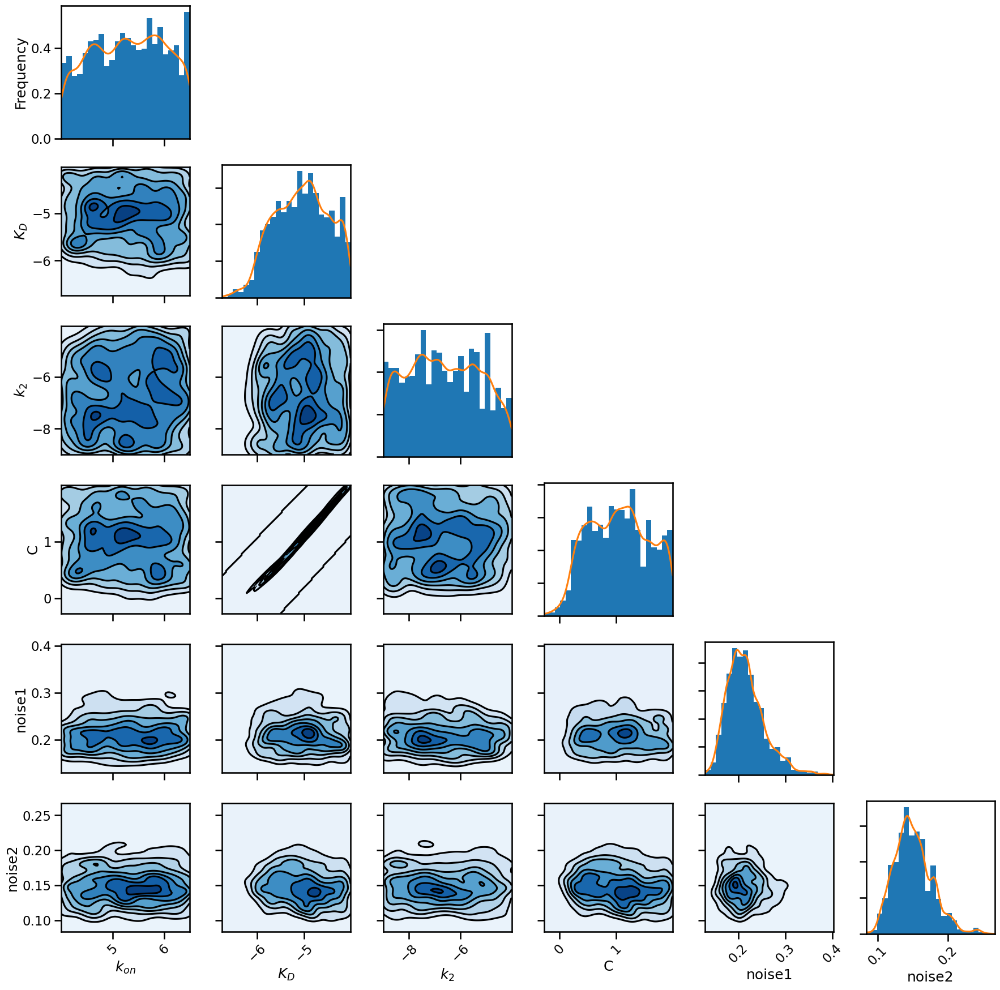

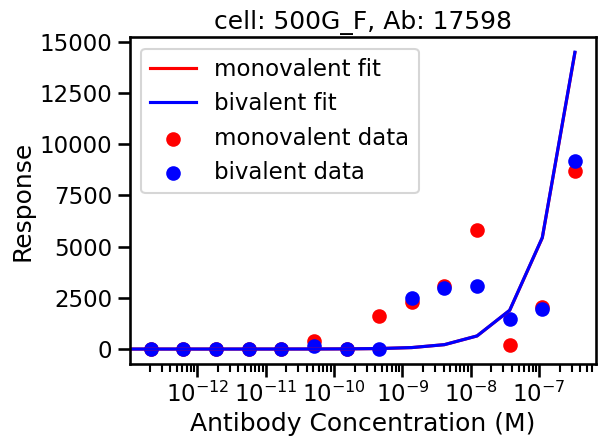

In [7]:
cell_ids = list(set(df['CELL_ID'].values))
antibody_ids1 = list(set(df['ANTIBODY_ID'].values))
antibody_ids = [x for x in antibody_ids1 if str(x) != 'nan']
antibody_ids.remove('RSV')
#antibody_ids.remove(17598)
monos = []
bivs = []
concs = []

for cell_id in cell_ids:
    print(cell_id)
    df2new = df.query('CELL_ID==@cell_id')
    df2new = df2new.loc[df2new['ANTIBODY_ID'].isnull()]
    subtract = df2new['RESPONSE'].values
    subtract = np.array(subtract[:-1])
    for antibody_id in antibody_ids:
        mono, biv, conc = data_extractor(df, cell_id, antibody_id)

        #remove last data point due to peak effect
        mono = np.array(mono[:-1])
        biv = np.array(biv[:-1])
        conc = np.array(conc[:-1])
        mono = mono - subtract
        biv = biv-subtract
        for i in range(len(mono)):
            if mono[i]<0:
                mono[i]=0
            if biv[i]<0:
                biv[i]=0
        monos.append(mono)
        bivs.append(biv)
        concs.append(conc)
        rtot = receptor_quant[cell_id]
        data = np.stack((mono, biv), axis=1)
        max = np.max(data)
        data = data/max 
        chain_results, results = mcmc_alg(cell_id, antibody_id, rtot, conc, mono, biv)
        
        #plot chains
        pints.plot.trace(chain_results, parameter_names=parameter_names) 
        name = str(cell_id) + str(antibody_id)
        chains_filename = '/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/Plots3/chains_%s.png' % name
        plt.tight_layout()
        plt.savefig(chains_filename)


        chain = chain_results[0]
        chain = chain[8000:]
        chains1 = chain_results[:, 8000 :]
        pints.plot.pairwise(chain, kde=True,  parameter_names=parameter_names)
        posteriors_filename = '/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/Plots3/posteriors_%s.png' % name
        plt.tight_layout()
        plt.savefig(posteriors_filename)

        results_list = results._summary_list
        results_dic = {}
        means =[]
        stds = []
        l_perc = []
        h_perc = []
        rhats = []
        parameter_names1=[r'$k_{on}$', r'$K_D$', r'$k_2$', 'C']
        for i, param in enumerate(parameter_names1):
            holder = results_list[i]
            means.append(holder[1])
            stds.append(holder[2])
            l_perc.append(holder[3])
            h_perc.append(holder[7])
            rhats.append(holder[8])

        results_dic['parameter'] = parameter_names1
        results_dic['mean'] = means
        results_dic['std'] = stds
        results_dic['2.5%'] = l_perc
        results_dic['97.5%'] = h_perc
        results_dic['rhat'] = rhats

        df_new = pd.DataFrame(results_dic)
        csv_name = posteriors_filename = '/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/Results3/results_%s.csv' % name
        df_new.to_csv(csv_name)

        sim = simulate_model(conc, results_dic['mean'], rtot)
        fig, ax = plt.subplots()
        ax.semilogx(conc, sim[:, 0], label='monovalent fit', c='red')
        ax.semilogx(conc, sim[:, 1], label = 'bivalent fit', c='blue')
        ax.scatter(conc, mono, label='monovalent data', c='red')
        ax.scatter(conc, biv, label='bivalent data', c='blue')
        ax.legend(loc='best')
        ax.set_ylabel('Response')
        ax.set_xlabel('Antibody Concentration (M)')
        ax.set_title('cell: ' + str(cell_id) + ', ' + 'Ab: ' + str(antibody_id))
        filename = '/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/Plots3/fitting_results%s.png' % name
        fig.tight_layout()
        fig.savefig(filename)

        

In [8]:
results_dic

{'parameter': ['$k_{on}$', '$K_D$', '$k_2$', 'C'],
 'mean': [np.float64(5.225408536581576),
  np.float64(-5.479836662117487),
  np.float64(-6.4647190127776),
  np.float64(0.8796151830401241)],
 'std': [np.float64(0.6821411407883887),
  np.float64(1.3575083170745603),
  np.float64(1.335539681032492),
  np.float64(0.6802952343139355)],
 '2.5%': [np.float64(4.070132549967459),
  np.float64(-9.790211512453387),
  np.float64(-8.835924832386617),
  np.float64(-0.4635738775854387)],
 '97.5%': [np.float64(6.430716537269199),
  np.float64(-4.10271867059774),
  np.float64(-4.191898891623397),
  np.float64(1.9402903498796817)],
 'rhat': [np.float64(1.017829689277734),
  np.float64(1.6569888545248326),
  np.float64(1.0158260543022954),
  np.float64(1.3987359354819886)]}

MSX_B
[  13498.5   35046.    28718.    18647.5   15801.  1024977.    60160.5
   34250.     8531.     7474.5    6969.     8479.     7273.     7608.
    6981. ]
500G_L
[7213.  7607.5 8374.  7566.5 7303.  7437.  7173.  7542.  7241.  6512.
 6655.  6903.  7656.  8591.  6630. ]
500G_B
[ 9545.5 10493.   9763.   9940.   9612.   9599.5  9486.   9716.   9199.
  9577.   7861.5  7330.   8669.   9428.   7894. ]
500G_F
[14841.5 14470.  14746.5 14040.  14094.  13929.  12799.  13898.  12103.
 12535.  11002.  10036.  12857.5 13418.  11930. ]


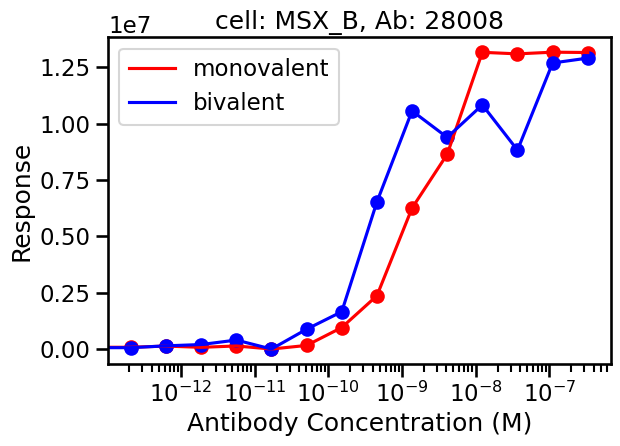

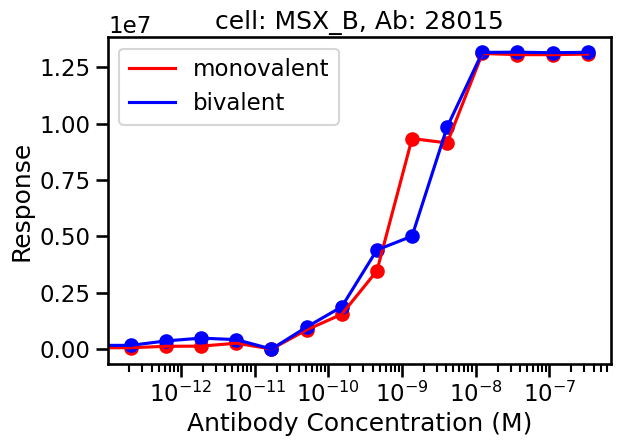

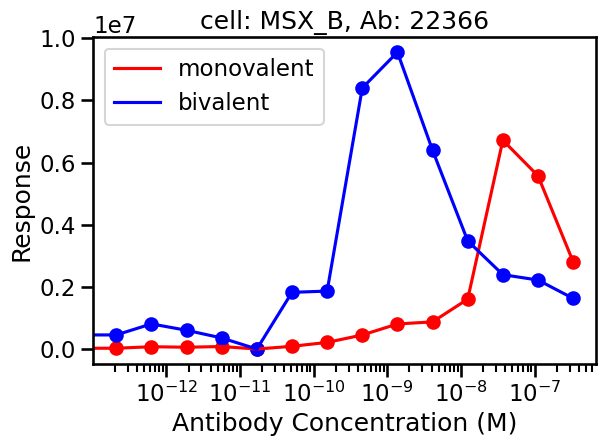

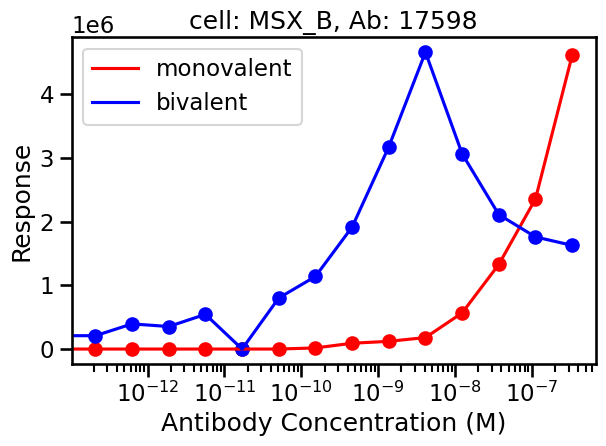

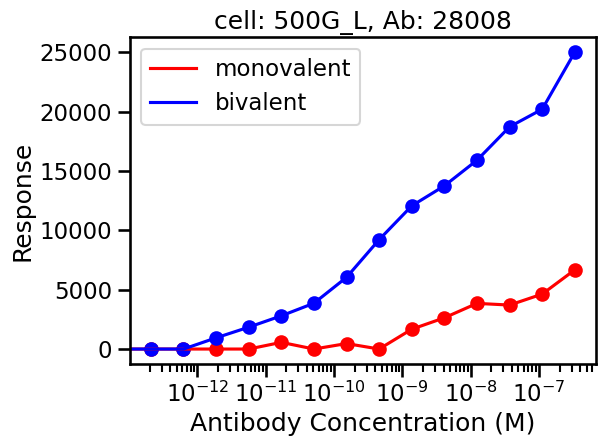

...

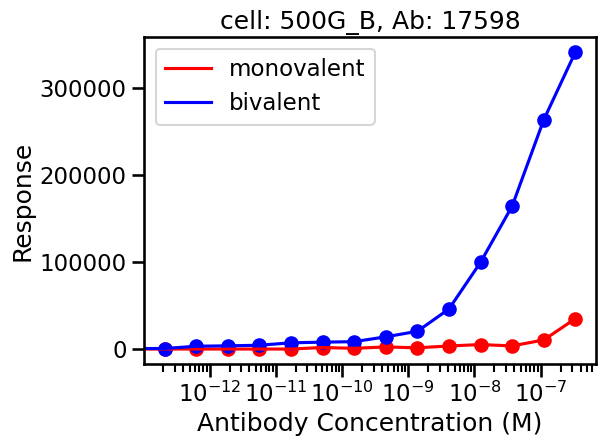

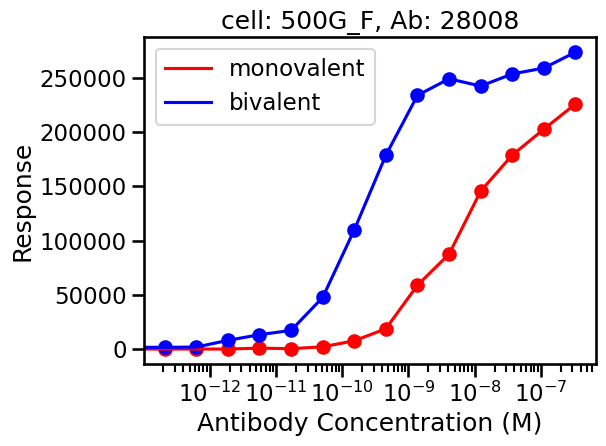

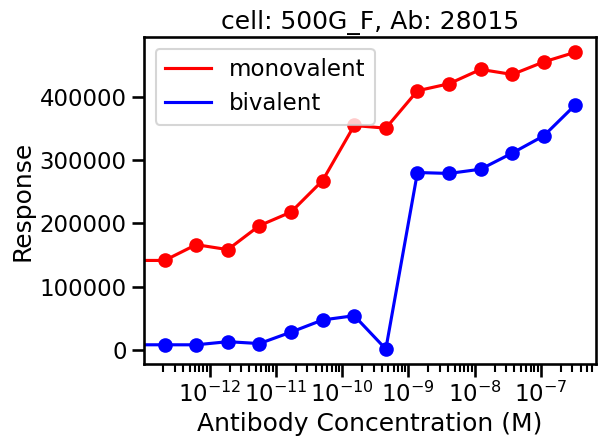

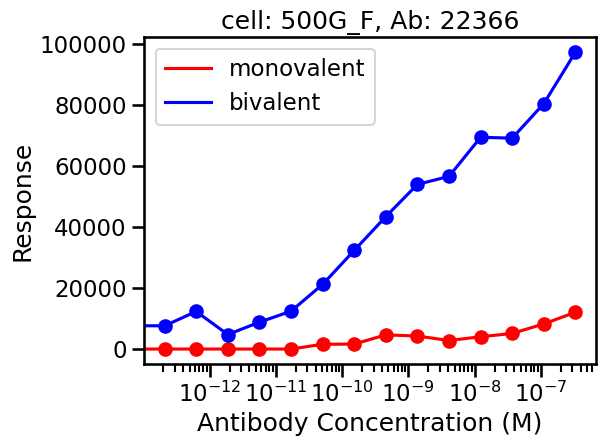

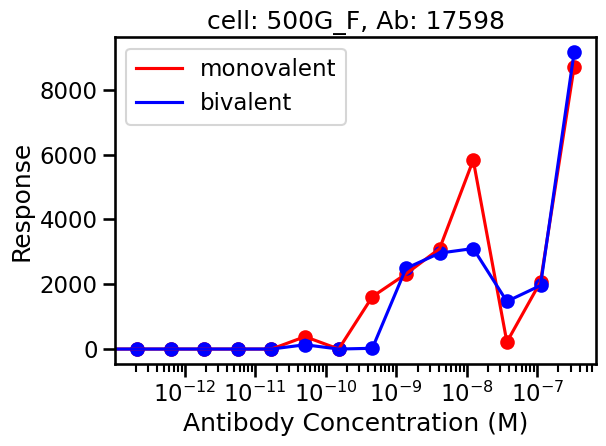

In [9]:
monos = []
bivs = []
concs = []
for cell_id in cell_ids:
    df2 = df.query('CELL_ID==@cell_id')
    df2 = df2.loc[df2['ANTIBODY_ID'].isnull()]
    subtract = df2['RESPONSE'].values
    subtract = np.array(subtract[:-1])
    print(cell_id)
    print(subtract)
    for antibody_id in antibody_ids:
        mono, biv, conc = data_extractor(df, cell_id, antibody_id)
        #remove last data point due to peak effect
        mono = np.array(mono[:-1])
        biv = np.array(biv[:-1])
        conc = np.array(conc[:-1])
        mono = mono - subtract
        biv = biv-subtract
        for i in range(len(mono)):
            if mono[i]<0:
                mono[i]=0
            if biv[i]<0:
                biv[i]=0
        monos.append(mono)
        bivs.append(biv)
        concs.append(conc)
        #rtot = receptor_quant[cell_id]
        fig = plt.figure()
        plt.plot(conc, mono, label = 'monovalent', c='red')
        plt.plot(conc, biv, label = 'bivalent', c='blue')
        plt.scatter(conc, mono, c='red')
        plt.scatter(conc, biv, c='blue')
        plt.legend(loc='best')
        plt.ylabel('Response')
        plt.xscale('log')
        plt.xlabel('Antibody Concentration (M)')
        name = str(cell_id) + str(antibody_id)
        plt.title('cell: ' + str(cell_id) + ', ' + 'Ab: ' + str(antibody_id))
        filename = '/Users/lukeheirene/ADCC-Project/GSK_mono_biv_project/Plots2/%s.png' % name
        plt.tight_layout()
        fig.savefig(filename)